In [1]:
%matplotlib inline
from matplotlib import pyplot as plt
plt.style.use('dark_background')
import numpy as np
import scipy as sp
plt.rcParams['image.origin'] = 'lower' 
from astroquery.simbad import Simbad
from astroquery.vizier import Vizier
from astropy.coordinates import SkyCoord
import astropy.coordinates as coord
from radio_beam import Beam
from astropy.io import fits
from astropy.units import cds
import astropy.units as u

gzip was not found on your system! You should solve this issue for astroquery.eso to be at its best!
On POSIX system: make sure gzip is installed and in your path!On Windows: same for 7-zip (http://www.7-zip.org)!


In [2]:
%run get_and_plot_vizier_nir.py

In [3]:
#%run get_and_plot_vizier_nir.py
%run functions.py

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(stars_background_im2,
          norm=visualization.simple_norm(stars_background_im2, stretch='asinh',
                                         max_percent=99, min_percent=1))

In [8]:
stars_background_im2, turbulent_stars2, turbulence2, header2 = get_and_plot_vizier_nir()

C:\Users\mjfer\Anaconda3\lib\site-packages\astropy\table\column.py:1020: RuntimeWarning: invalid value encountered in greater
  result = getattr(super(), op)(other)


ValueError: The `bounding_box` is larger than the input out in one or more dimensions. Set `model.bounding_box = None`.

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(stars_background_im2, norm=visualization.simple_norm(stars_background_im2, stretch='asinh',
                                         max_percent=99, min_percent=1))

In [8]:
np.min(stars_background_im2), np.max(stars_background_im2)

(72.8430207717295, 22143228359.982742)

In [4]:
x = np.array([1023,250,10])
y = np.array([1023,250,10])
source_table = Table({'amplitude': np.array([1e50,5e22, 1e20]),
                          'x_mean': x, #np.array([0,0,0]),
                          'y_mean': y, #np.array([0,0,0]),
                          'x_0': x,
                          'y_0': y,
                          'radius': np.array([2,2,2]),
                          'x_stddev' : abs(1.2 * (x - 1024)/4096 * (x - 1024)/4096),
                          'y_stddev' : abs(0.8 * (x + 1024)/4096 * (x - 1024)/4096),
                          'theta' : np.pi * (x-1024),
                         })
shape = [2048, 2048]
airy_radius = 3.2

In [5]:
image1 = make_model_sources_image_faster(shape, airy_radius, source_table,
                                    bbox_size=10,
                                    progressbar=False)

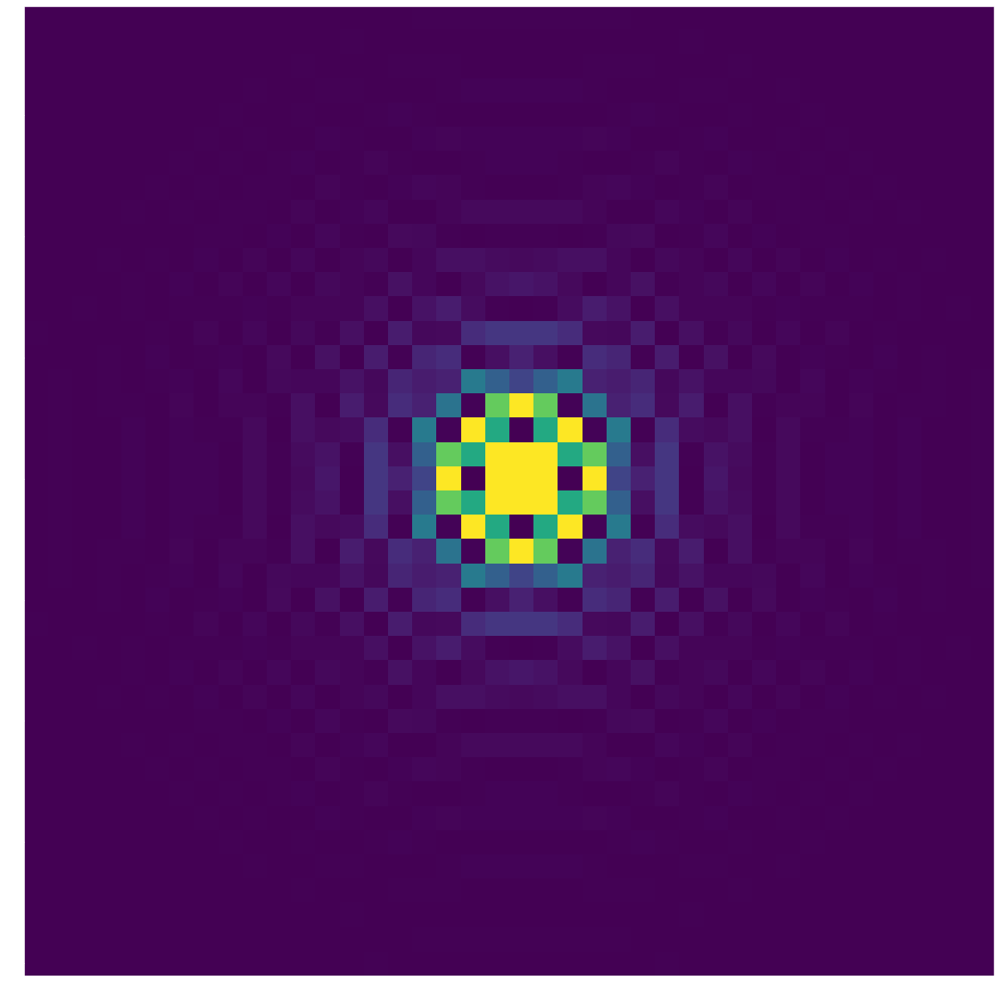

In [10]:
plt.figure(figsize=(20,20))
plt.imshow(image1[1003:1043, 1003:1043], vmax=1e48)

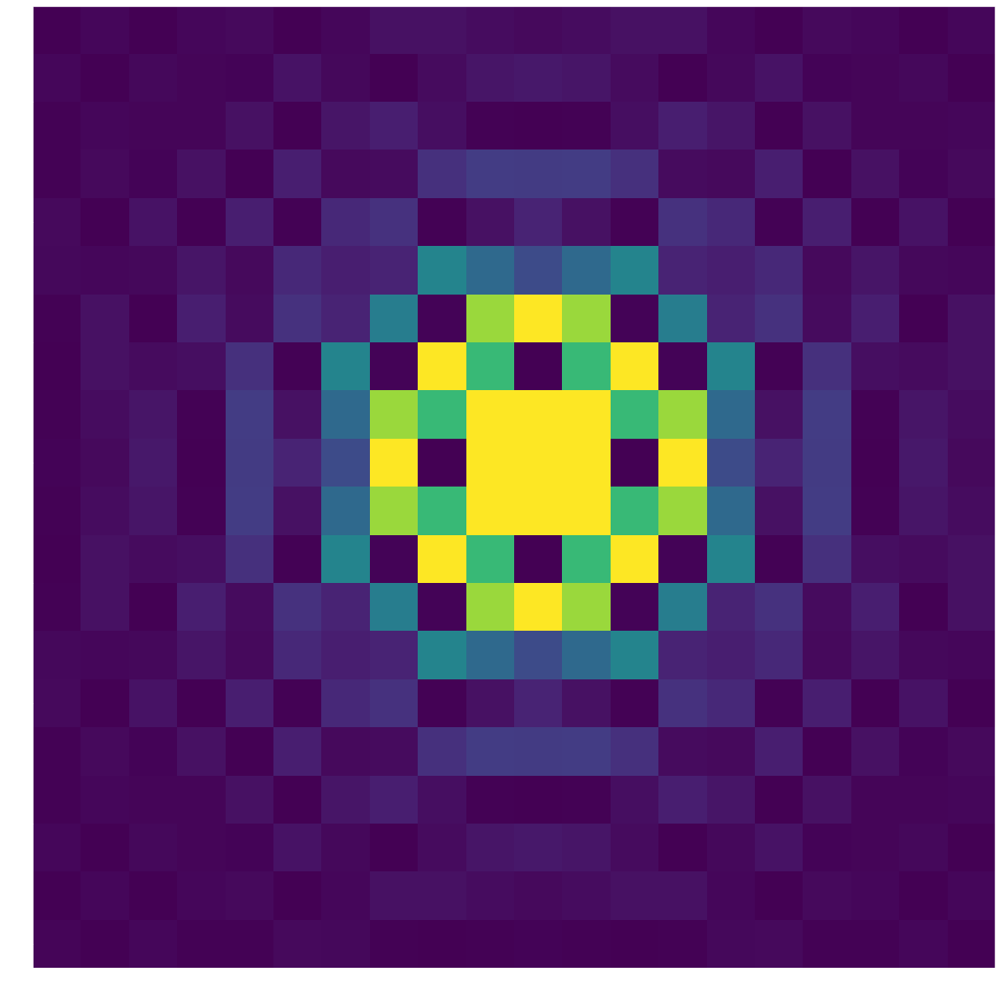

In [12]:
plt.figure(figsize=(20,20))
plt.imshow(image1[0:20, 0:20], vmax = 9e+17)

In [7]:
np.unravel_index(image1.argmin(), image1.shape), np.unravel_index(image1.argmax(), image1.shape), image1.min(), image1.max()

((1025, 1023), (1023, 1023), -1.1959491131528202e+33, 1e+50)

In [8]:
loc = np.where(image1 != 0),
loc

((array([   0,    0,    0, ..., 1043, 1043, 1043], dtype=int64),
  array([   0,    1,    2, ..., 1041, 1042, 1043], dtype=int64)),)

In [4]:
stars_background_im = make_stars_im(1000, nstars=100)

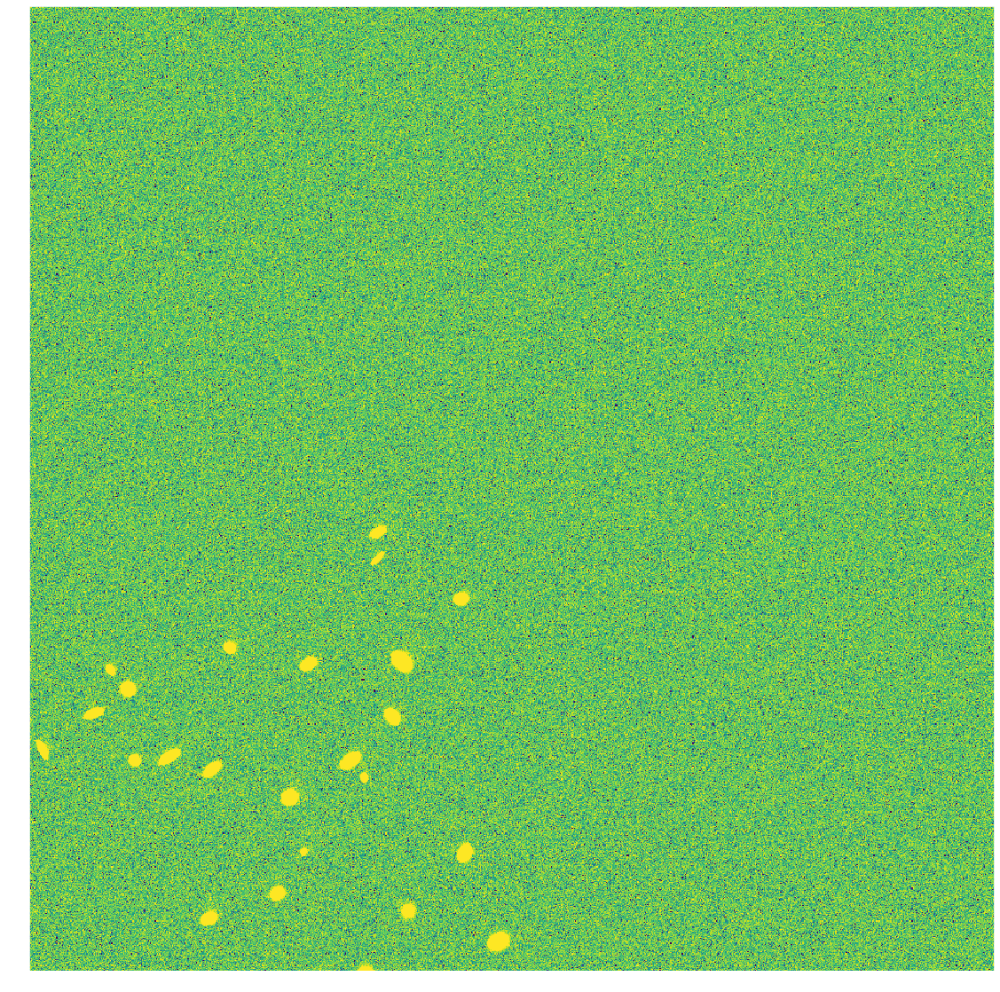

In [5]:
plt.figure(figsize=(20,20))
plt.imshow(stars_background_im,
          norm=visualization.simple_norm(stars_background_im, stretch='asinh',
                                         max_percent=99, min_percent=1))

In [7]:
#MWE
#numbers are random bc i haven't found any that change the outcome
from astropy.convolution import convolve_models, Gaussian2DKernel
from astropy.modeling import models
g1 = models.Gaussian2D(amplitude=2, x_mean=7, y_mean=6, x_stddev=9, y_stddev=10, theta=11)
g2 = models.AiryDisk2D(amplitude=7, x_0=7, y_0=6, radius=1)
g3 = convolve_models(g2, g1)
g3([0],[0])

array([1.32433848e-08])

In [6]:
g1, g2, g3

(<Gaussian2D(amplitude=2., x_mean=0., y_mean=0., x_stddev=9., y_stddev=10., theta=11.)>,
 <AiryDisk2D(amplitude=7., x_0=0., y_0=0., radius=1.)>,
 <CompoundModel(amplitude_0=7., x_0_0=0., y_0_0=0., radius_0=1., amplitude_1=2., x_mean_1=0., y_mean_1=0., x_stddev_1=9., y_stddev_1=10., theta_1=11.)>)

In [68]:
# this example shows that setting x_mean=0, y_mean=0 puts the peak at the right location
yy,xx = np.mgrid[-5:5:0.1,-5:5:0.1]
g1 = models.AiryDisk2D(amplitude=0.5, x_0=1, y_0=1)
g2 = models.Gaussian2D(amplitude=3, x_mean=0, y_mean=0, x_stddev=0.1, y_stddev=0.2, theta=np.pi/4)
g3forward_eval = convolve_models(g1,g2)(xx,yy)
g3reverse_eval = convolve_models(g2,g1)(xx,yy)
forward_argmax = np.argmax(g3forward_eval)
reverse_argmax = np.argmax(g3reverse_eval)
print(f"forward peak = {xx.flat[forward_argmax]}, {yy.flat[forward_argmax]} (should be 1,1)")
print(f"reverse peak = {xx.flat[reverse_argmax]}, {yy.flat[reverse_argmax]} (should be 1,1)")

# this example shows that setting x_mean=-1.5, y_mean=-2 puts the peak at the wrong location
yy,xx = np.mgrid[-5:5:0.1,-5:5:0.1]
g1 = models.AiryDisk2D(amplitude=0.5, x_0=1, y_0=1)
g2 = models.Gaussian2D(amplitude=3, x_mean=-1.5, y_mean=-2, x_stddev=0.1, y_stddev=0.2, theta=np.pi/4)
g3forward_eval = convolve_models(g1,g2)(xx,yy)
g3reverse_eval = convolve_models(g2,g1)(xx,yy)
forward_argmax = np.argmax(g3forward_eval)
reverse_argmax = np.argmax(g3reverse_eval)
print(f"forward peak = {xx.flat[forward_argmax]}, {yy.flat[forward_argmax]} (should be 1,1)")
print(f"reverse peak = {xx.flat[reverse_argmax]}, {yy.flat[reverse_argmax]} (should be 1,1)")


forward peak = 1.0, 1.0 (should be 1,1)
reverse peak = 1.0, 1.0 (should be 1,1)
forward peak = -0.5, -1.0 (should be 1,1)
reverse peak = -0.5, -1.0 (should be 1,1)


In [93]:
image2 = np.zeros([2048,2048], dtype=np.float64)

In [95]:
g3forward_eval = convolve_models(g1,g2)
g3reverse_eval = convolve_models(g2,g1)
g3forward_eval.render(image2)
#g3reverse_eval.render(image2)

array([[ 1.03687075e+40,  1.07833011e+40,  7.57764706e+39, ...,
        -7.58609003e+30, -9.03898269e+29, -4.67682108e+29],
       [ 1.07833011e+40,  7.52456174e+39,  2.90580733e+39, ...,
        -1.59226636e+30,  3.51349901e+30, -5.40959178e+30],
       [ 7.57764706e+39,  2.90580733e+39,  1.22140332e+38, ...,
         3.67894678e+29, -4.10850390e+30,  3.88048857e+30],
       ...,
       [ 7.42495107e+29,  5.85467058e+29, -5.08468457e+30, ...,
         4.11047258e+29,  2.42467101e+30,  3.74456521e+30],
       [-3.77978984e+30, -1.81143631e+29, -1.42508176e+30, ...,
        -1.21154294e+30, -4.49652158e+29, -1.22816422e+30],
       [-2.05788249e+30, -2.68576169e+29,  4.55896202e+30, ...,
        -2.34309530e+29, -3.12247465e+30,  2.77489705e+30]])

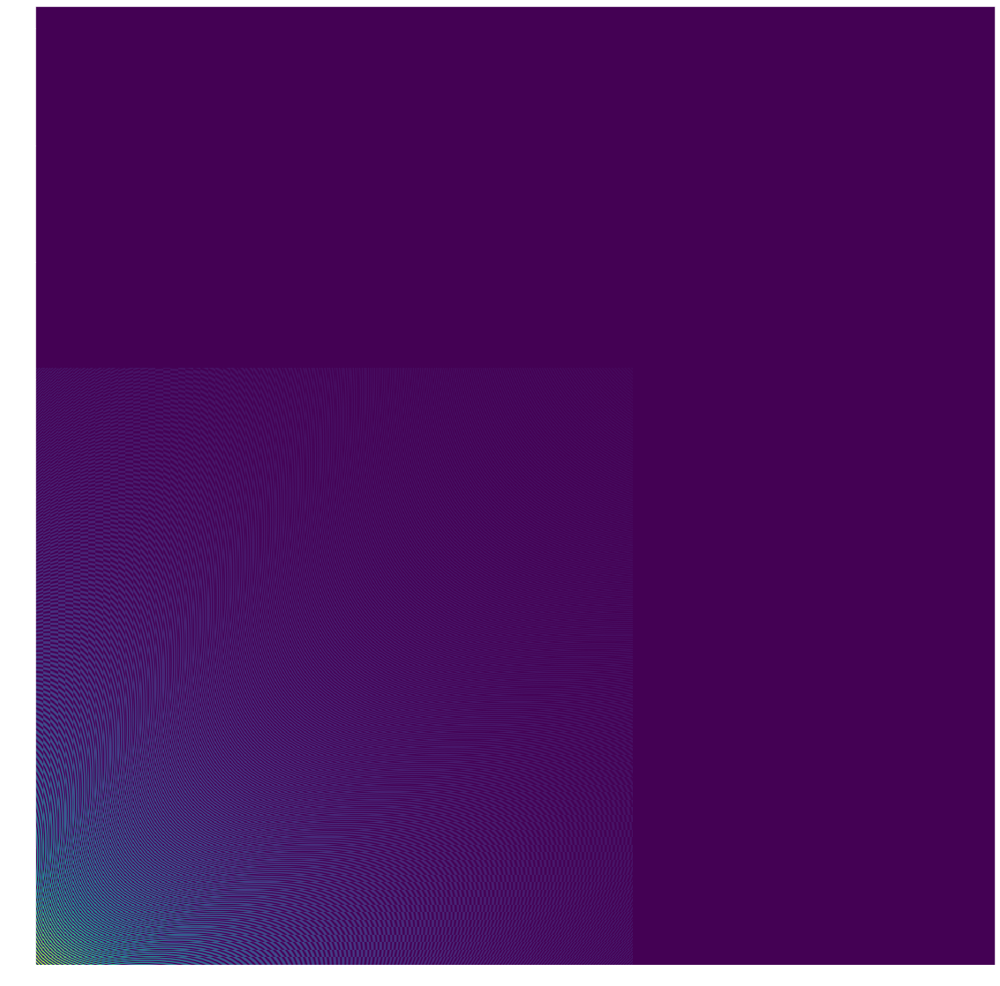

In [96]:
plt.figure(figsize=(20,20))
plt.imshow(image2)

In [97]:
loc2 = np.where(image2 != 0),
loc2

((array([   0,    0,    0, ..., 2047, 2047, 2047], dtype=int64),
  array([   0,    1,    2, ..., 2045, 2046, 2047], dtype=int64)),)

In [98]:
np.unravel_index(image2.argmin(), image2.shape), np.unravel_index(image2.argmax(), image2.shape), image2.min(), image2.max()

((500, 1620), (7, 1), -3.1775559212742334e+32, 1.0871253693242324e+40)

In [4]:
stars_background_im1, turbulent_stars1, turbulence1, header1 = get_and_plot_vizier_nir()

C:\Users\mjfer\Anaconda3\lib\site-packages\astropy\table\column.py:1020: RuntimeWarning: invalid value encountered in greater
  result = getattr(super(), op)(other)


In [5]:
stars_background_im2, turbulent_stars2, turbulence2, header2 = get_and_plot_vizier_nir(vary_psf=True)

C:\Users\mjfer\Anaconda3\lib\site-packages\astropy\table\column.py:1020: RuntimeWarning: invalid value encountered in greater
  result = getattr(super(), op)(other)


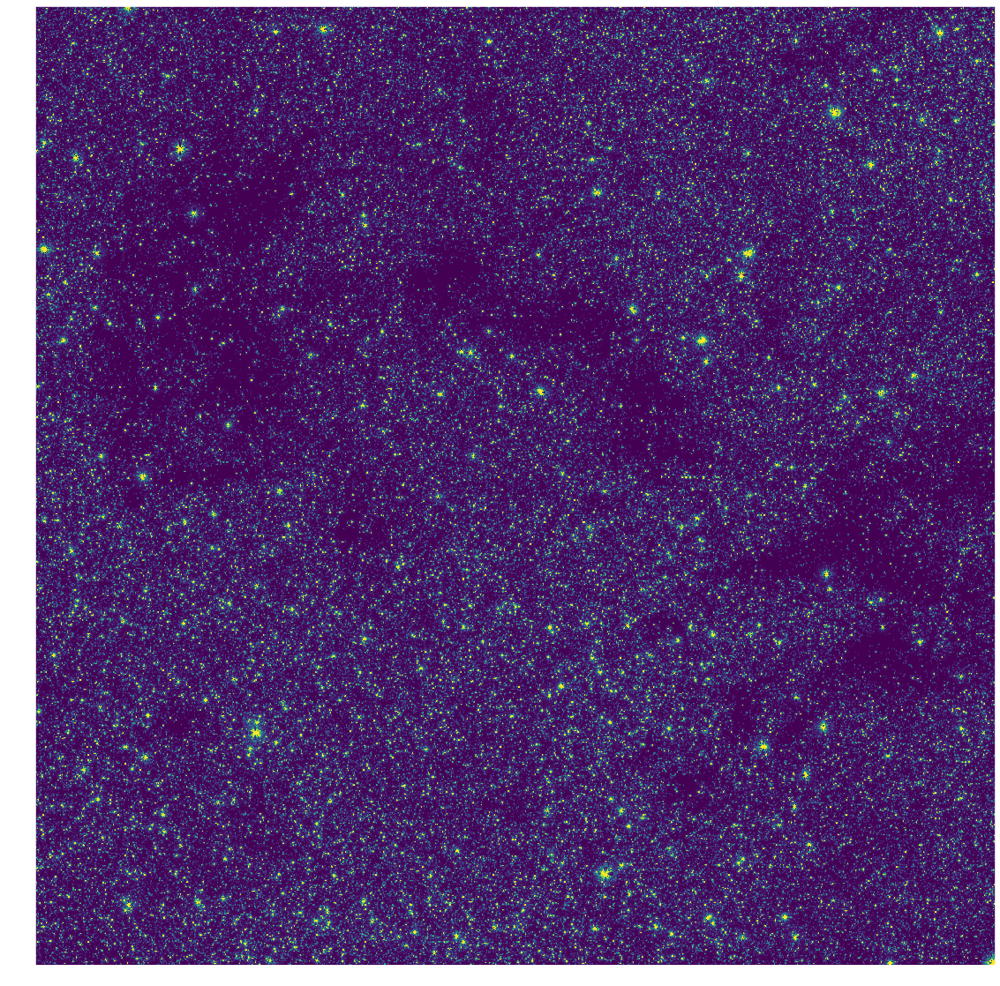

In [6]:
plt.figure(figsize=(20,20))
plt.imshow(stars_background_im1, norm=visualization.simple_norm(stars_background_im1, stretch='asinh',
                                         max_percent=99, min_percent=1))

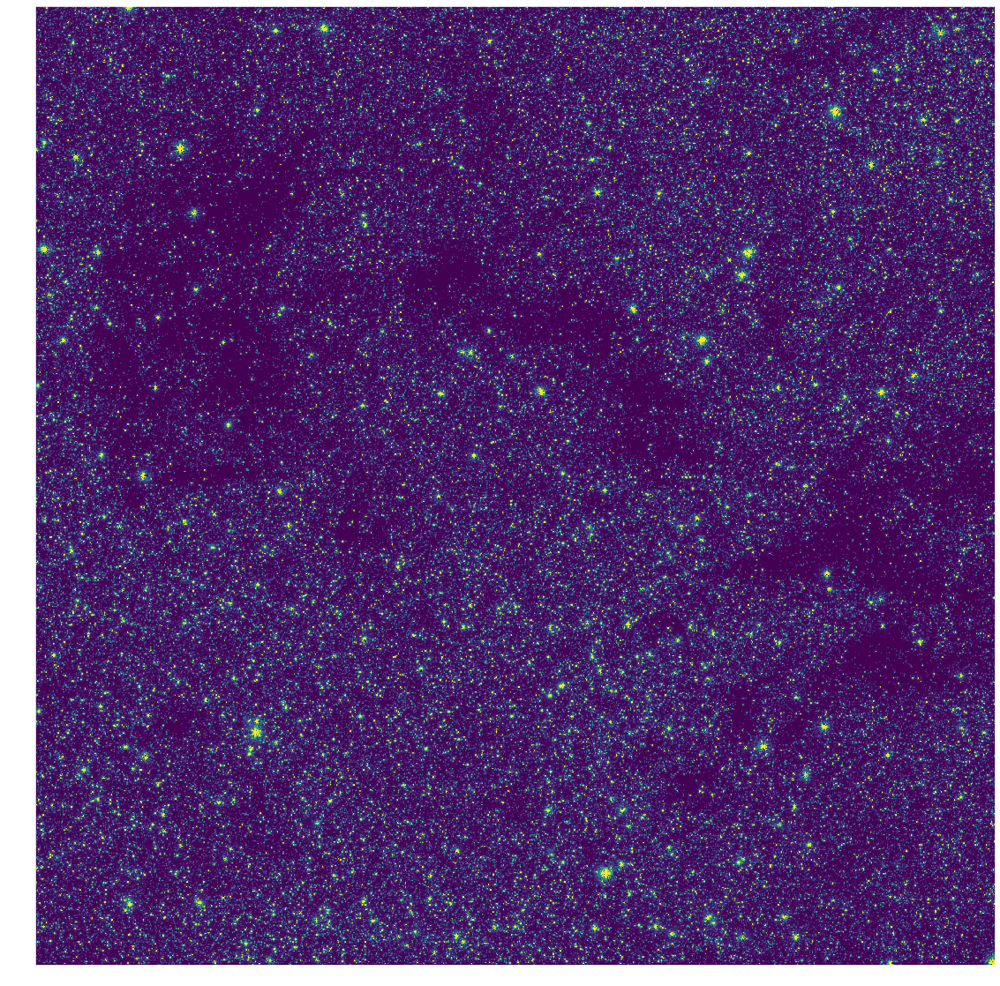

In [7]:
plt.figure(figsize=(20,20))
plt.imshow(stars_background_im2, norm=visualization.simple_norm(stars_background_im2, stretch='asinh',
                                         max_percent=99, min_percent=1))

In [8]:
stars_background_im3 = stars_background_im2 - stars_background_im1

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(stars_background_im3, norm=visualization.simple_norm(stars_background_im3, stretch='asinh',
                                         max_percent=99, min_percent=1))

In [4]:
source_table_both, s1, s2, header = make_source_table()

invalid value encountered in greater


In [27]:
fluxes = np.log10(0.22120502590587818/1000)*(-2.5)
fluxes

9.138012524584795

In [18]:
source_table_both.sort('amplitude')
source_table_both

amplitude,x_mean,y_mean,x_0,y_0,radius,x_stddev,y_stddev,theta
,,,,,,,,
float64,float64,float64,float64,float64,float64,float64,float64,float64
0.22120502590587818,1211.0,514.0,1210.513259387737,514.0870271096196,2.439938637967358,0.0068024776395231926,0.004534985093015462,585.948685489602
1.7106076521119953,1668.0,1710.0,1667.9289171579394,1710.442031791904,2.439938637967358,0.03161572510410236,0.021077150069401574,2022.9623555774128
1.7170109604749288,1543.0,991.0,1542.6938770592787,991.2566469295782,2.439938637967358,0.0012147743762982786,0.0008098495841988525,1629.5248736314375
2.7110508156283384,1941.0,1815.0,1941.3183689805564,1815.1421761514782,2.439938637967358,0.051908201026368284,0.034605467350912196,2881.8406489922872
2.761454038339706,1550.0,236.0,1550.4972612149675,235.51419230484862,2.439938637967358,0.029692813271882678,0.019795208847921787,1654.039927968088
3.4763148412815426,579.0,307.0,578.9797058079453,307.37551451861066,2.439938637967358,0.022810395194589453,0.015206930129726303,-1398.0724869321277
3.6168917315823434,181.0,284.0,181.12657192390589,283.5186582953496,2.439938637967358,0.044641402738736936,0.02976093515915796,-2647.964969549902
3.6170980311241587,2044.0,616.0,2044.4827532717811,616.0334794686655,2.439938637967358,0.0297777269922155,0.019851817994810336,3205.941120793713


In [56]:
s1.sort('Ksmag3')
s1_bad = s1['Ksmag3'].mask
s1_correct = s1[~s1_bad]
s1_val = []
for ii in range(len(s1_correct)):
    if s1_correct['Ksmag3'][ii] <= 11:
        s1_val.append(ii)
s1_next = s1_correct[s1_val]
s1_next.rename_column('Ksmag3', 'Kmag')
s1_final = s1_next['RAJ2000', 'DEJ2000', 'Kmag']
s1_final

RAJ2000,DEJ2000,Kmag
deg,deg,mag
float64,float64,float64
267.921819,-26.875347,6.901
267.998762,-26.566201,7.063
267.958004,-26.528626,7.142
268.019637,-26.837188,7.149
268.117344,-26.735072,7.186
267.984930,-26.562162,7.208
268.066012,-26.687199,7.322
268.020694,-26.835428,7.328


In [57]:
s2.sort('Kmag')
s2_bad = s2['Kmag'].mask
s2_correct = s2[~s2_bad]
s2_val = []
for ii in range(len(s2_correct)):
    if s2_correct['Kmag'][ii] <= 11:
        s2_val.append(ii)
s2_next = s2_correct[s2_val]
s2_final = s2_next['RAJ2000', 'DEJ2000', 'Kmag']
s2_final

RAJ2000,DEJ2000,Kmag
deg,deg,mag
float64,float64,float32
268.020185,-26.836239,3.356
268.050880,-26.786837,4.204
267.856742,-27.056444,4.700
267.591780,-26.965292,4.784
267.952586,-26.697050,5.161
267.654074,-26.467770,5.251
267.921811,-26.875317,5.287
267.508362,-26.783243,5.315


In [58]:
s3 = table.vstack([s1_final, s2_final])

Cannot merge meta key 'ucd' types <class 'str'> and <class 'str'>, choosing ucd='PHOT_JHN_K'
Cannot merge meta key 'width' types <class 'int'> and <class 'int'>, choosing width=6
Cannot merge meta key 'null' types <class 'float'> and <class 'float'>, choosing null=nan
In merged column 'Kmag' the 'format' attribute does not match ({:7.3f} != {:6.3f}).  Using {:6.3f} for merged output
In merged column 'Kmag' the 'description' attribute does not match (? Default source Ks aperture corrected mag 2.0 arcsec diameter (KSAPERMAG3) != ?(k_m) K selected default magnitude (2)).  Using ?(k_m) K selected default magnitude (2) for merged output


In [59]:
s3

RAJ2000,DEJ2000,Kmag
deg,deg,mag
float64,float64,float64
267.921819,-26.875347,6.901
267.998762,-26.566201,7.063
267.958004,-26.528626,7.142
268.019637,-26.837188,7.149
268.117344,-26.735072,7.186
267.984930,-26.562162,7.208
268.066012,-26.687199,7.322
268.020694,-26.835428,7.328


In [60]:
stars_background_im, turbulent_stars, turbulence, header = get_and_plot_vizier_nir()

invalid value encountered in greater


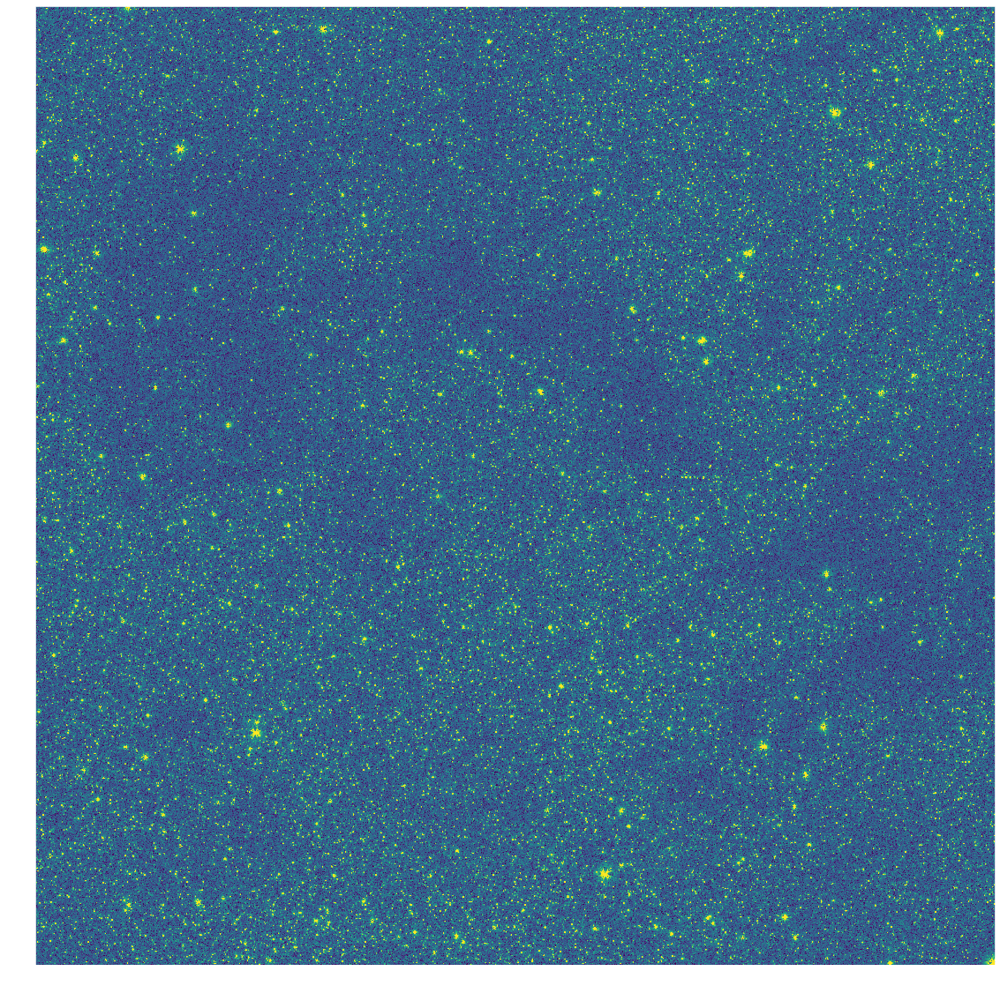

In [61]:
plt.figure(figsize=(20,20))
plt.imshow(stars_background_im, norm=visualization.simple_norm(stars_background_im, stretch='asinh',
                                         max_percent=99, min_percent=1))

In [4]:
%run vvv_sims_at_a_few_locations.py

invalid value encountered in greater
invalid value encountered in greater
invalid value encountered in greater


KeyboardInterrupt: 

In [4]:
stars_background_im, turbulent_stars, turbulence, header = get_and_plot_vizier_nir(10*u.deg, 5*u.deg, wavelength=18756*u.AA, bandwidth=5*u.nm, linename='paa')
stars_background_im_paach, turbulent_stars_paach, turbulence_paach, header_paach = get_and_plot_vizier_nir(10*u.deg, 5*u.deg, wavelength=18850*u.AA, bandwidth=10*u.nm, linename='paac_h')
stars_background_im_paacl, turbulent_stars_paacl, turbulence_paacl, header_paacl = get_and_plot_vizier_nir(10*u.deg, 5*u.deg, wavelength=18660*u.AA, bandwidth=10*u.nm, linename='paac_l')

> c:\users\mjfer\desktop\code\adam research\github\paschenalphamodeling\get_and_plot_vizier_nir.py(36)make_source_table()
-> cat2 = cats['II/348/vvv2']
(Pdb) n
TypeError: TableLists can only be indexed with the named keys and integers.
> c:\users\mjfer\desktop\code\adam research\github\paschenalphamodeling\get_and_plot_vizier_nir.py(36)make_source_table()
-> cat2 = cats['II/348/vvv2']
(Pdb) cats
Empty TableList
(Pdb) c


TypeError: TableLists can only be indexed with the named keys and integers.